# Introduction

This notebook is going to cover the basics of how to use Stable Diffusion to create and modify images using existing pipelines. We'll also take a brief look at the key components within the pipeline, while leaving further exploration of them to the deep dive notebook. Specifically, we will cover:
- Generating images from text using the `StableDiffusionPipeline` and experimenting with the available arguments
- Seeing some of the key pipeline components in action
    - The VAE that makes this a 'latent diffusion model'
    - The tokenizer and text encoder that process the text prompt
    - The UNet itself
    - The scheduler, and exploring different schedulers
- Replicating the sampling loop with the pipeline components
- Editing existing images with the Img2Img pipeline
- Using inpainting and Depth2Img pipelines

❓If you have any questions, please post them on the `#diffusion-models-class` channel on the Hugging Face Discord server. If you haven't signed up yet, you can do so here: https://huggingface.co/join/discord


# Setup

In [6]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
import torch
# Set device
device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


In [10]:
import requests
from PIL import Image
from io import BytesIO
from matplotlib import pyplot as plt

# We'll be exploring a number of pipelines today!
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionDepth2ImgPipeline
    )

from src.diffusers.src.diffusers.models.unet_2d_condition import UNet2DConditionModel
from diffusers import AutoencoderKL, LMSDiscreteScheduler, PNDMScheduler, DDPMScheduler, DDIMScheduler, StableDiffusionPipeline
from transformers import CLIPTextModel, CLIPTokenizer

# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="vae", torch_dtype=torch.float16)
# 2. Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="tokenizer", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="text_encoder", torch_dtype=torch.float16)
# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="unet", torch_dtype=torch.float16)
# 4. The scheduler for the diffusion process.
scheduler = DDIMScheduler.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="scheduler", torch_dtype=torch.float16)

## Move to device
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device)

# We'll use a couple of demo images later in the notebook
def download_image(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content)).convert("RGB")

# Download images for inpainting example
img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = download_image(img_url).resize((512, 512))
mask_image = download_image(mask_url).resize((512, 512))

/home/fidgetsinner/foo/python/sds/src/diffusers/src/diffusers/models/lora.py:384: FutureWarning: `LoRACompatibleLinear` is deprecated and will be removed in version 1.0.0. Use of `LoRACompatibleLinear` is deprecated. Please switch to PEFT backend by installing PEFT: `pip install peft`.
  deprecate("LoRACompatibleLinear", "1.0.0", deprecation_message)
/home/fidgetsinner/foo/python/sds/src/diffusers/src/diffusers/models/lora.py:300: FutureWarning: `LoRACompatibleConv` is deprecated and will be removed in version 1.0.0. Use of `LoRACompatibleConv` is deprecated. Please switch to PEFT backend by installing PEFT: `pip install peft`.
  deprecate("LoRACompatibleConv", "1.0.0", deprecation_message)


In [16]:
from transformers import SamModel, SamProcessor

device = "cuda" if torch.cuda.is_available() else "cpu"
model = SamModel.from_pretrained("facebook/sam-vit-huge").to(device)
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

In [17]:
# torch.cuda.empty_cache()
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def encode_imgs(imgs):
        # imgs: [B, 3, H, W]

        imgs = 2 * imgs - 1

        posterior = vae.encode(imgs).latent_dist
        latents = posterior.sample() * vae.config.scaling_factor

        return latents

def decode_latents(latents):
    latents =  latents / vae.config.scaling_factor

    with torch.no_grad():
        image = vae.decode(latents).sample

    return image

def vis_img(imgs, label=" "):
    if(len(imgs.shape)>3):
        imgs = imgs[0]
    if(imgs.shape[0] == 3):
        imgs = np.transpose(imgs, (1,2,0))
    plt.figure()
    plt.imshow(imgs)
    plt.title(label)
    plt.show()

@torch.no_grad()
def get_text_embeds(prompt):
    # prompt: [str]

    inputs = tokenizer(prompt, padding='max_length', max_length=tokenizer.model_max_length, return_tensors='pt')
    embeddings = text_encoder(inputs.input_ids.to(device))[0]

    return inputs, embeddings



def clip_loss(x):
    # Calculate the penalty for values outside the range [0, 1]
    penalty = torch.clamp(x, min=0) - torch.clamp(x, max=1)
    # Calculate the mean squared penalty
    penalty_loss = torch.mean(torch.abs(penalty))
    return penalty_loss

In [15]:
# pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1-base", torch_dtype=torch.float16)
# pipe.to(device)

precision = torch.float16
scheduler = PNDMScheduler.from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="scheduler", torch_dtype=precision)
alphas = scheduler.alphas_cumprod.to(device)

## Giraffe

In [13]:
# Embeddings
tokens1, text_embeddings1 = get_text_embeds(["", "DSLR photo of a giraffe in the desert"])

custom_tokens, custom_text_embeddings = get_text_embeds(["DSLR photo of a giraffe", "in the desert"])
print(custom_tokens)
print(text_embeddings1.shape)
text_embeddings1[1][5] = custom_text_embeddings[0][5]
text_embeddings1[1][6:10] = custom_text_embeddings[1][1:5]

print(tokens1)
text_embeddings = [text_embeddings1]

{'input_ids': tensor([[49406, 33740,  1125,   539,   320, 22826, 49407,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0],
        [49406,   530,   518,  7301, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0, 

In [18]:
# Masks
img_url = "https://ik.imagekit.io/storybird/images/b5c6b396-df6c-44d1-be37-a914a8b7db0a/1_934066845.png"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")
input_points = [[[300, 250]]]  # 2D location of a window in the image

inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
)
scores = outputs.iou_scores

vis_img(np.asarray(raw_image))
print(scores)

mask1 = (torch.mean(masks[0].float(), axis=1) > 0).float().expand(1, 3,512,512)
vis_img(mask1)
mask2 = (torch.mean(masks[0].float(), axis=1) == 0).float().expand(1, 3,512,512)
vis_img(mask2)

obj_masks = [mask1.to(device), mask2.to(device)]

interp_mask = F.interpolate(mask1, size=(32,32), mode="bilinear")
vis_img(interp_mask.cpu())

OutOfMemoryError: CUDA out of memory. Tried to allocate 1024.00 MiB. GPU 0 has a total capacity of 5.79 GiB of which 513.75 MiB is free. Including non-PyTorch memory, this process has 5.28 GiB memory in use. Of the allocated memory 5.01 GiB is allocated by PyTorch, and 120.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

## Car

In [ ]:
# Embeddings
tokens1, text_embeddings1 = get_text_embeds(["", "a photo of a road and a blue car"])
tokens2, text_embeddings2 = get_text_embeds(["", "a photo of a road"])

custom_tokens, custom_text_embeddings = get_text_embeds(["a photo of a road", "and", "a photo of a blue car"])
print(custom_tokens)
print(text_embeddings1.shape)
text_embeddings1[1][6] = custom_text_embeddings[1][1]
text_embeddings1[1][7:11] = custom_text_embeddings[2][4:8]

print(tokens1)
text_embeddings = [text_embeddings1, text_embeddings2]

{'input_ids': tensor([[49406,   320,  1125,   539,   320,  1759, 49407,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0],
        [49406,   537, 49407,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0, 

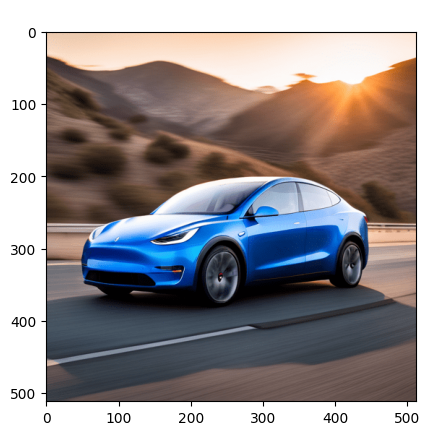

tensor([[[0.9907, 0.9977, 0.9946]]], device='cuda:0')


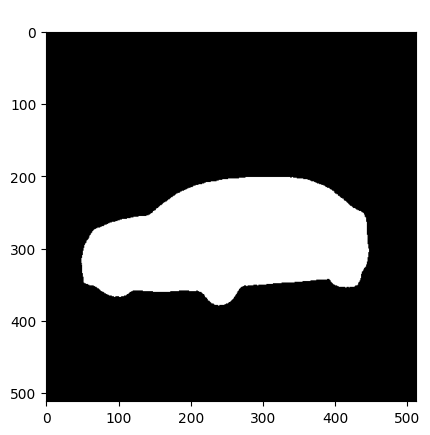

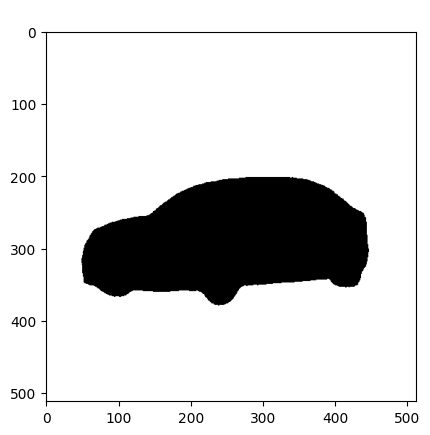

In [ ]:
# Masks
img_url = "https://i0.wp.com/greenlivingguy.com/wp-content/uploads/2023/07/IMG_2373.png?fit=512%2C512&quality=80&ssl=1"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")
input_points = [[[250, 300]]]  # 2D location of a window in the image

inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
)
scores = outputs.iou_scores

vis_img(np.asarray(raw_image))
print(scores)
# vis_img(masks[0].float())


# a = torch.zeros_like(masks[0])
# print(a.shape)
# a[0,:,0:200] = masks[0][0,:,180:380]
# mask1 = (torch.mean(a.float(), axis=1) > 0).float().expand(1, 3,512,512)
# vis_img(mask1)
# mask2 = (torch.mean(a.float(), axis=1) == 0).float().expand(1, 3,512,512)
# vis_img(mask2)

mask1 = (torch.mean(masks[0].float(), axis=1) > 0).float().expand(1, 3,512,512)
vis_img(mask1)
mask2 = (torch.mean(masks[0].float(), axis=1) == 0).float().expand(1, 3,512,512)
vis_img(mask2)

obj_masks = [mask1.to(device), mask2.to(device)]

## Sampling with Masks

In [ ]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
guidance_scale = 50
img = torch.nn.Parameter(0.5*torch.ones(1, 3, 512,512), requires_grad=True)
opt = torch.optim.Adam([img], lr=0.1)
img.to(device)
b_size = 4

<ipython-input-18-181e14a7fc44>:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  decoded_img = torch.tensor(image).permute(dims=(0,3,1,2))


0


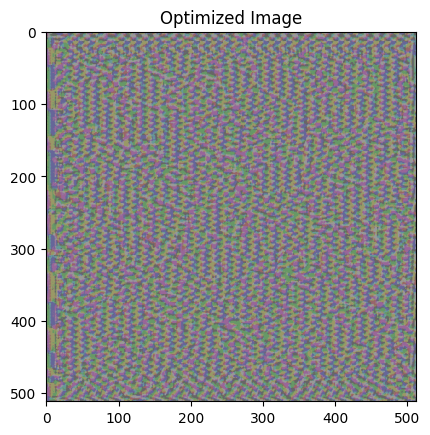

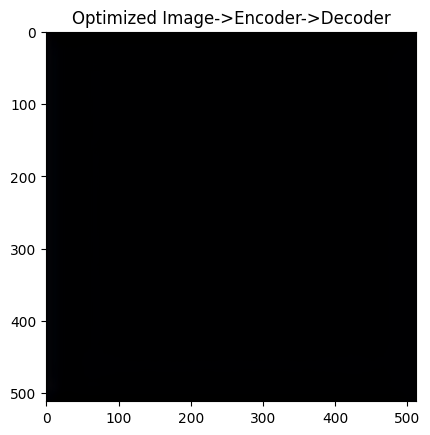

50


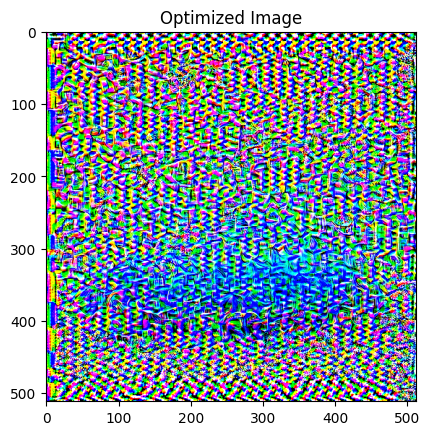

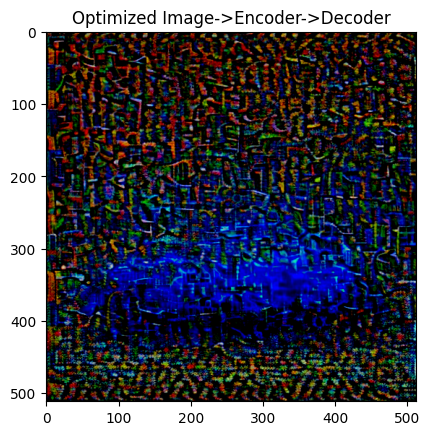

100


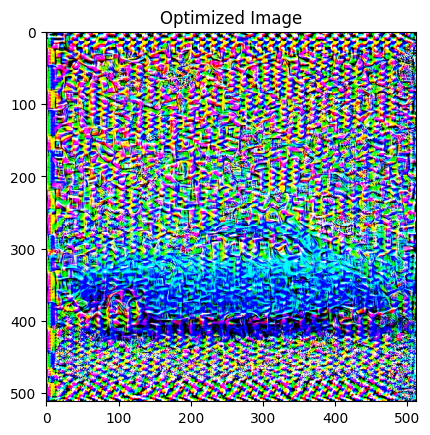

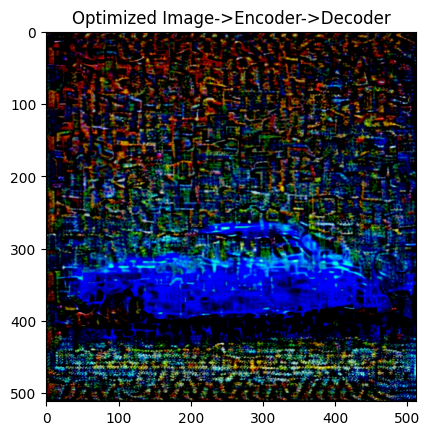

150


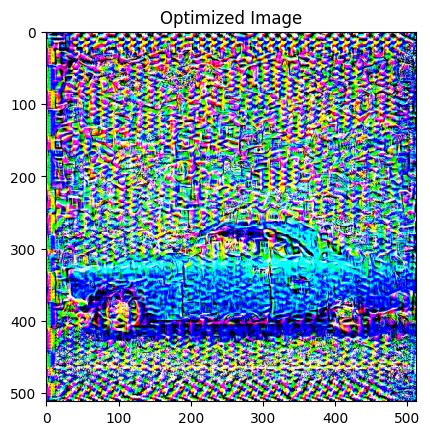

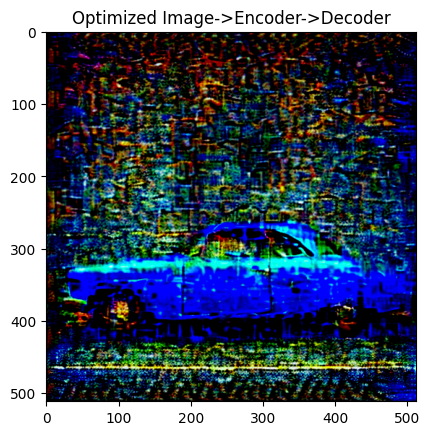

200


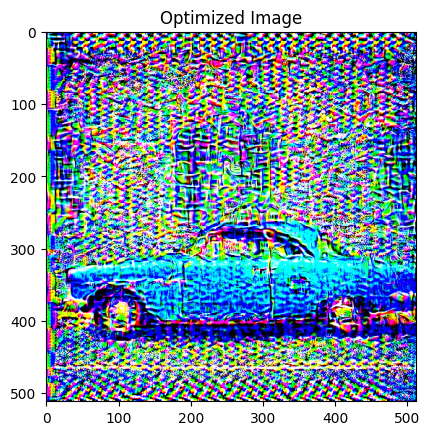

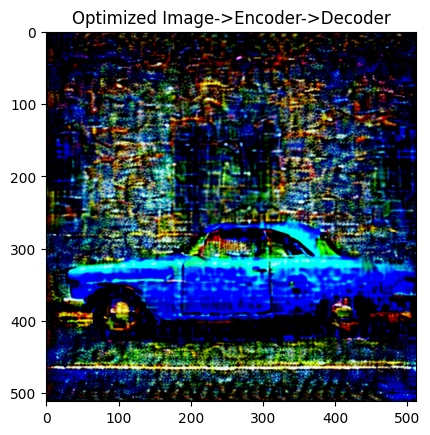

250


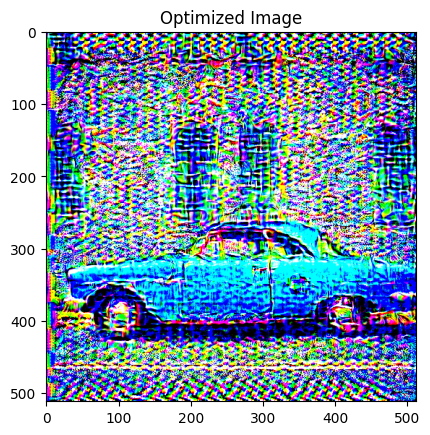

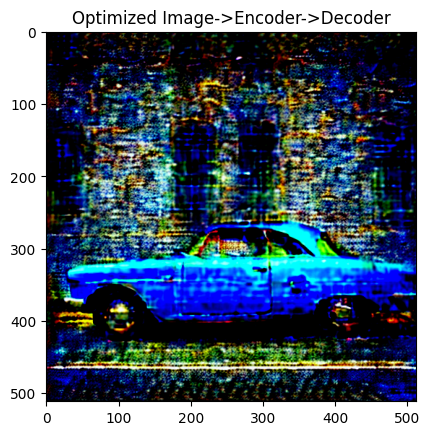

300


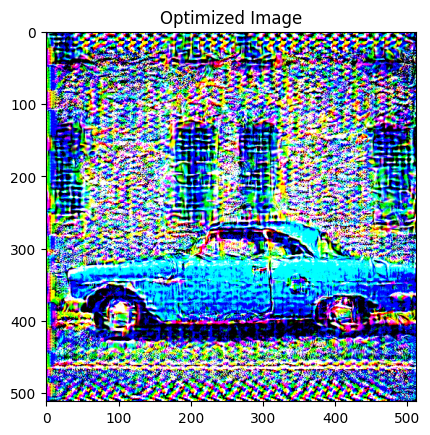

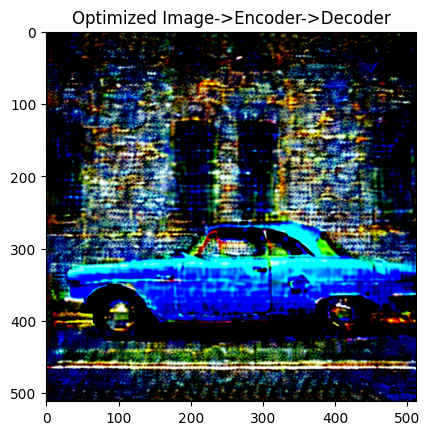

350


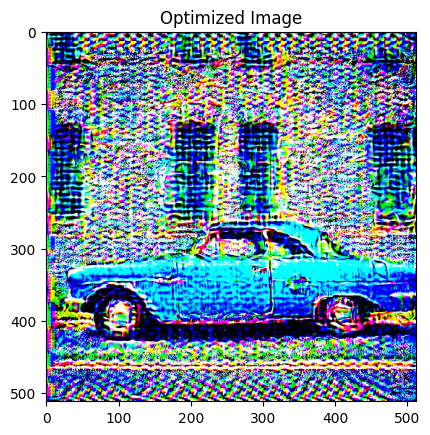

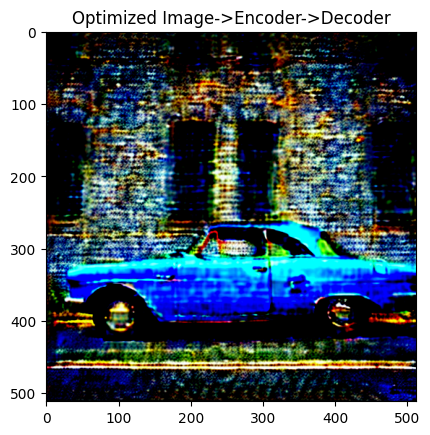

400


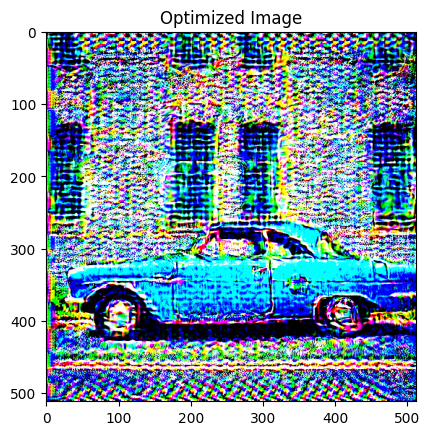

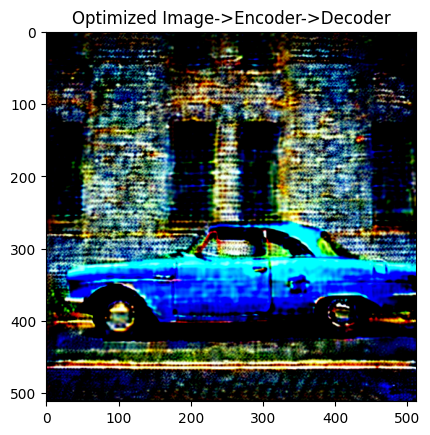

KeyboardInterrupt: 

In [ ]:
# @title Default title text
num_objs = len(obj_masks)
for i in range(6000):
    # for obj_id in range(num_objs):
    for obj_id in range(0,1):
        input_img = img.type(torch.float16).to(device)
        latents = encode_imgs(input_img)
        latents = latents.expand(b_size, 4, 64, 64)
        b_text_embeddings = torch.cat(b_size*[text_embeddings[obj_id][0:1]]+b_size*[text_embeddings[obj_id][1:2]])
        curr_mask = obj_masks[obj_id]
        loss = 0
        with torch.no_grad():
            if(i >= 3000):
                t = torch.randint(20, 500 + 1, (latents.shape[0],), dtype=torch.long, device=device)
            else:
                t = torch.randint(20, 980 + 1, (latents.shape[0],), dtype=torch.long, device=device)
            noise = torch.randn_like(latents)
            latents_noisy = scheduler.add_noise(latents, noise, t)
            # pred noise
            latent_model_input = torch.cat([latents_noisy] * 2)
            tt = torch.cat([t] * 2)

            input_dict = {"embs": b_text_embeddings, "mask": curr_mask.type(torch.float16), "attn_masks": []}
            # noise_pred = unet(latent_model_input, tt, encoder_hidden_states=b_text_embeddings).sample
            noise_pred = unet(latent_model_input, tt, encoder_hidden_states=input_dict).sample
            # perform guidance (high scale from paper!)
            noise_pred_uncond, noise_pred_pos = noise_pred.chunk(2)
            # noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_pos - noise_pred_uncond)
            noise_pred = guidance_scale * (noise_pred_pos - noise_pred_uncond)
            w = (1 - alphas[t])
            grad = w[:, None, None, None] * (noise_pred - noise)
            grad = torch.nan_to_num(grad)
        targets = (latents - grad).detach()
        loss = 0.5 * F.mse_loss(latents.float(), targets, reduction='sum') / latents.shape[0]

        with torch.no_grad():
            image = decode_latents(latents[0:1].detach()).cpu()
            image = image.float()
        decoded_img = torch.tensor(image).permute(dims=(0,3,1,2))

        opt.zero_grad()
        loss.backward()
        # print(img.device, curr_mask.device)
        # apply mask
        # img.grad *= curr_mask.cpu()
        opt.step()

        if(i%50 == 0):
            print(i)
            vis_img(img.detach().cpu().numpy(), label="Optimized Image")
            # Decode the resulting latents into an image
            vis_img(image, label="Optimized Image->Encoder->Decoder")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import gc

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    del mask
    gc.collect()

def show_masks_on_image(raw_image, masks):
    plt.imshow(np.array(raw_image))
    ax = plt.gca()
    ax.set_autoscale_on(False)
    for mask in masks:
        show_mask(mask, ax=ax, random_color=True)
    plt.axis("off")
    plt.show()
    del mask
    gc.collect()

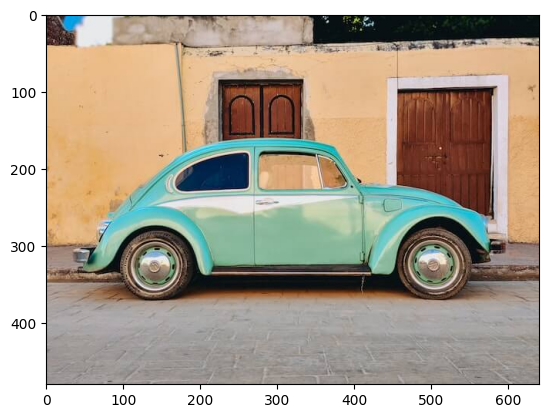

In [ ]:
from transformers import pipeline
generator = pipeline("mask-generation", model="facebook/sam-vit-huge", device=0)

from PIL import Image
import requests
img_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")
plt.imshow(raw_image)

1.0 0.0


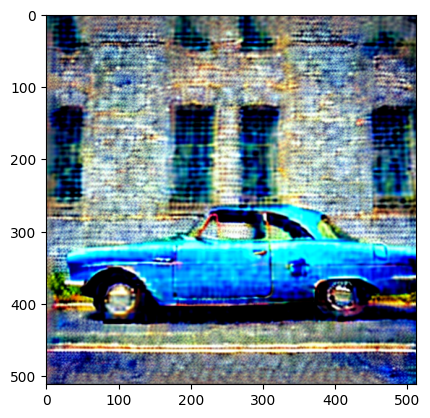

In [ ]:
test_img = image.permute(0,2,3,1).squeeze(0).numpy()
test_img = np.clip(test_img, -1,1)
test_img = (test_img+1)/2
plt.imshow(test_img)
print(np.max(test_img), np.min(test_img))

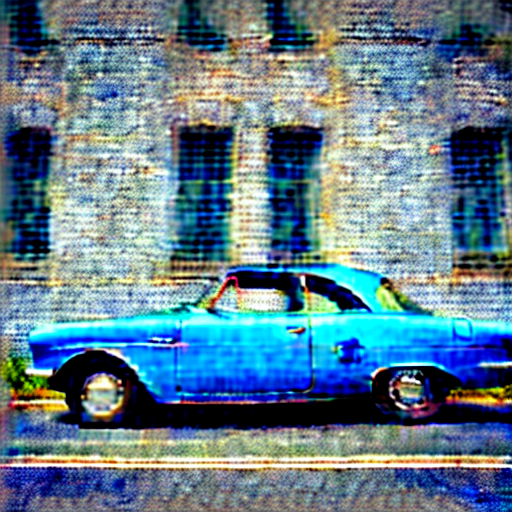

In [ ]:
test_img = image.permute(0,2,3,1).squeeze(0).numpy()
test_img = np.clip(test_img, -1,1)
test_img = (test_img+1)/2
test_img = Image.fromarray((test_img*255).astype(np.uint8))
test_img

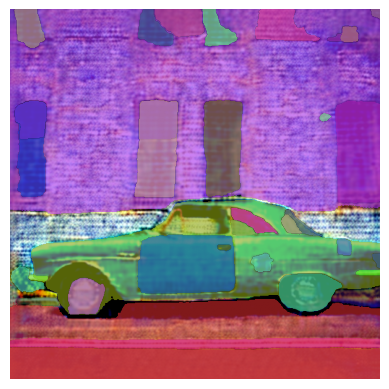

In [ ]:
outputs = generator(test_img, points_per_batch=64)

masks = outputs["masks"]
show_masks_on_image(test_img, masks)

In [ ]:
len(masks), masks[0].shape

(37, (512, 512))

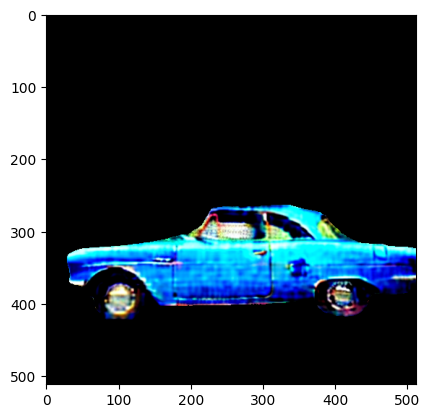

In [ ]:
plt.imshow(np.expand_dims(masks[0], -1)*test_img)

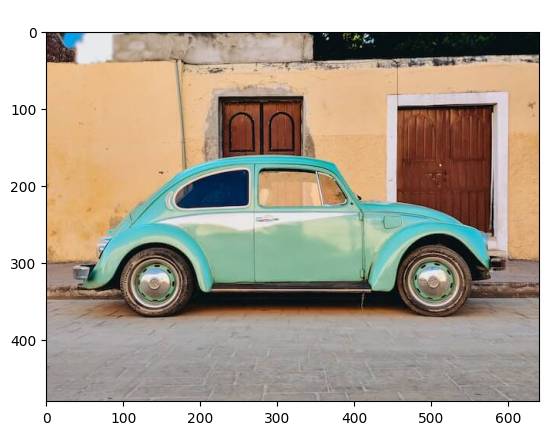

tensor([[[0.9808, 0.9992, 0.9747]]], device='cuda:0')


RuntimeError: The expanded size of the tensor (512) must match the existing size (640) at non-singleton dimension 3.  Target sizes: [1, 3, 512, 512].  Tensor sizes: [1, 480, 640]

In [ ]:
input_points = [[[300, 250]]]  # 2D location of a window in the image

inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
)
scores = outputs.iou_scores

vis_img(np.asarray(raw_image))
print(scores)

mask1 = (torch.mean(masks[0].float(), axis=1) > 0).float().expand(1, 3,512,512)
vis_img(mask1)
mask2 = (torch.mean(masks[0].float(), axis=1) == 0).float().expand(1, 3,512,512)
vis_img(mask2)

In [ ]:
def plot_images(images, titles=None, cmap='gray', figsize=(15, 5)):
    """
    Plot a set of images in a row.

    Parameters:
    - images: List of NumPy arrays representing the images.
    - titles: List of titles for each image (optional).
    - cmap: Colormap for displaying the images (default is 'gray').
    - figsize: Tuple specifying the size of the figure (default is (15, 5)).
    """
    num_images = len(images)

    if titles is not None and len(titles) != num_images:
        raise ValueError("Number of titles should match the number of images.")

    fig, axes = plt.subplots(1, num_images, figsize=figsize)

    for i in range(num_images):
        axes[i].imshow(images[i], cmap=cmap)
        axes[i].axis('off')

        if titles is not None:
            axes[i].set_title(titles[i])

    plt.show()

In [ ]:
input_dict["attn_masks"][0].shape


target = "<start> DSLR photo of a giraffe in the desert <end>"
target_strings = target.split()

for k in range(len(input_dict["attn_masks"])):
    attn_grid = input_dict["attn_masks"][k]
    L = int(attn_grid.shape[2] ** (1/2))
    print("Spatial Dim:", L)
    for j in range(attn_grid.shape[1]):
        token_mask = attn_grid[0,j]
        token_mask = torch.reshape(token_mask, (L,L,-1))
        token_masks = []
        for i in range(10):
            token_masks.append(token_mask[:,:,i].cpu().numpy())
        plot_images(token_masks, titles=target_strings)

